In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import mne
from collections import defaultdict 
import re

In [2]:
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

In [3]:
%matplotlib notebook

# Load Data from an Intan RHD file.
### Header information (and saved data, if present) will be stored in the *result* variable. You'll also be able to specify a channel's name to plot its recorded data as an example of accessing data from *result*.

In [4]:
# Load the background Python functions that allow for data loading and plotting
%run importrhdutilities.py

### Name of file to load. To load a different file, move it to the same directory as this notebook, and change the following 'filename' variable to point the name of your file.

In [5]:
import numpy as np
import pandas as pd

# Given center coordinate in mm
# center_ml, center_ap, center_vd = 3.0, -2.5, -1.5
center_ml, center_ap, center_vd = 0, 0, 0

# spacing = 0.5  # Distance between electrodes
spacing = 1  # Distance between electrodes


# # Define grid positions (assuming a 4x4 layout)
# grid_positions = np.array([
#     [15, 11, 6, 2],
#     [16, 12, 7, 3],
#     [17, 13, 8, 4],
#     [18, 14, 9, 5]
# ])

# Define grid positions (assuming a 4x4 layout)
grid_positions = np.array([
    [15, 19, 8, 20],
    [14, 18, 9, 21],
    [13, 17, 10, 22],
    [12, 16, 11, 23]
])

# Calculate coordinates
channel_coords = []
for row_idx, row in enumerate(grid_positions):
    for col_idx, channel in enumerate(row):
        ml = center_ml + (col_idx - 1.5) * spacing  # Adjusting for 4x4 center
        ap = center_ap - (row_idx - 1.5) * spacing  # Adjusting for row shift
        channel_coords.append((channel, ml, ap, center_vd))

# Convert to DataFrame
df_coords = pd.DataFrame(channel_coords, columns=["Channel", "ML (mm)", "AP (mm)", "VD (mm)"])
print(df_coords)

df_coords["Channel"] = df_coords["Channel"].astype(int).astype(str)

# Save to CSV
df_coords.to_csv("channel_coordinates.csv", index=False)


    Channel  ML (mm)  AP (mm)  VD (mm)
0        15     -1.5      1.5        0
1        19     -0.5      1.5        0
2         8      0.5      1.5        0
3        20      1.5      1.5        0
4        14     -1.5      0.5        0
5        18     -0.5      0.5        0
6         9      0.5      0.5        0
7        21      1.5      0.5        0
8        13     -1.5     -0.5        0
9        17     -0.5     -0.5        0
10       10      0.5     -0.5        0
11       22      1.5     -0.5        0
12       12     -1.5     -1.5        0
13       16     -0.5     -1.5        0
14       11      0.5     -1.5        0
15       23      1.5     -1.5        0


In [6]:
denominator = 35

In [7]:
# Create channel positions dictionary
ch_pos = {str(row["Channel"]): [row["ML (mm)"] / denominator, row["AP (mm)"] / denominator, row["VD (mm)"] / denominator] for _, row in df_coords.iterrows()}

/tmp/ipykernel_53456/1714244572.py:5: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  montage.plot(kind="topomap", show=True)


<IPython.core.display.Javascript object>

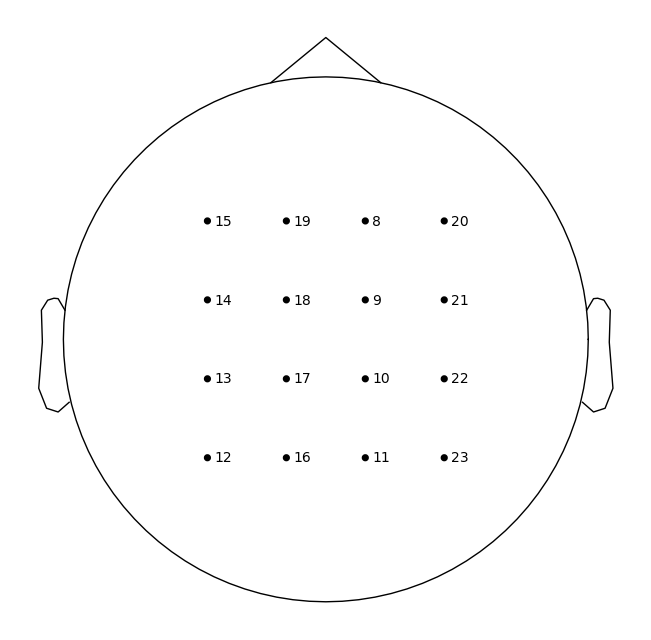

In [8]:
# Create montage (coord_frame='unknown' for non-human data)
montage = mne.channels.make_dig_montage(ch_pos=ch_pos, coord_frame="unknown")

# Visualize the montage
montage.plot(kind="topomap", show=True)

In [9]:
# Plot the 2D coordinates (ML vs AP) in Matplotlib
fig, ax = plt.subplots(figsize=(6, 6))

# Iterate over each channel and plot it
for _, row in df_coords.iterrows():
    ax.scatter(row["ML (mm)"], row["AP (mm)"], color='red', s=100)
    ax.text(row["ML (mm)"], row["AP (mm)"], str(int(row["Channel"])), fontsize=12,
            ha='center', va='center', color='white', bbox=dict(facecolor='black', alpha=0.6))

# Formatting the plot
ax.set_xlabel("Medio-Lateral (ML) Position (mm)")
ax.set_ylabel("Antero-Posterior (AP) Position (mm)")
ax.set_title("Electrode Layout in ML-AP Space")
ax.set_xticks(np.arange(df_coords["ML (mm)"].min() - 0.5, df_coords["ML (mm)"].max() + 0.5, spacing))
ax.set_yticks(np.arange(df_coords["AP (mm)"].min() - 0.5, df_coords["AP (mm)"].max() + 0.5, spacing))
ax.grid(True, linestyle='--', alpha=0.7)
plt.gca()  # AP coordinates usually decrease in the posterior direction

# Show plot
plt.savefig("Electrode_Layout.png")

<IPython.core.display.Javascript object>

In [10]:
raise ValueError()

ValueError: 

In [13]:
# Re-import necessary libraries after execution state reset
import pandas as pd

# Define table data extracted from the image
data = [
    # Iso first
    [2, "30s", "Silence002", "30"],
    [3, "60s", "Foot pinch, both (5s-20s wait)003", "10-15 20-30 40-45 50-55"],
    [4, "30s", "Silence avg ref 004", "30s"],
    [5, "60s", "Foot pinch, left (5s-20s wait)005", "10-15 20-30 40-45 50-55"],
    [6, "30s", "Silence 006", "30s"],
    [7, "60s", "Foot pinch right 007", "10-15 20-30 40-45 52-57"],

    # Iso + Ketamine repeat same steps
    [8, "30s", "Silence", ""],
    [9, "60s", "Foot pinch, left", "10-15 20-30 40-45 50-56"],
    [10, "30s", "Silence avg ref", "30s"],
    [11, "60s", "Foot pinch, right", "10-15 20-30 40-45 50-56"],
    [12, "30s", "Silence", "30s"],
    [13, "30s", "E pulse stim 500us/s 100uA biphasic", "Move to the left hemi, add a hole to put the stimulating wire in (one string of a strand of the soft cable) Reference is far away on the right hemi"],
    [14, "30s", "E pulse stim 500us/s 500uA biphasic", ""],
    [15, "30s", "E pulse stim 500us/s 1000uA biphasic", ""],
    [16, "60s", "Silence", ""],
    [17, "20s", "Silence", "Another hole near the stimulation hole as the ground, move the ground closer to the same hemi"],
    [18, "30s", "E pulse stim 500us/s 100uA biphasic", ""],
    [19, "30s", "E pulse stim 500us/s 500uA biphasic", ""],
    [20, "30s", "E pulse stim 500us/s 1000uA biphasic", ""]
]

# Create DataFrame
recording_notes = pd.DataFrame(data, columns=["# of Test", "Duration", "Action", "Stimulation time window in seconds"])


In [14]:
recording_notes

,# of Test,Duration,Action,Stimulation time window in seconds
0,2,30s,Silence002,30
1,3,60s,"Foot pinch, both (5s-20s wait)003",10-15 20-30 40-45 50-55
2,4,30s,Silence avg ref 004,30s
3,5,60s,"Foot pinch, left (5s-20s wait)005",10-15 20-30 40-45 50-55
4,6,30s,Silence 006,30s
5,7,60s,Foot pinch right 007,10-15 20-30 40-45 52-57
6,8,30s,Silence,
7,9,60s,"Foot pinch, left",10-15 20-30 40-45 50-56
8,10,30s,Silence avg ref,30s
9,11,60s,"Foot pinch, right",10-15 20-30 40-45 50-56


In [15]:
# Function to convert MM:SS to seconds
def mmss_to_seconds(value):
    if ':' in value:
        minutes, seconds = map(int, value.split(':'))
        return minutes * 60 + seconds
    return int(value)  # If the value is already in seconds

# Function to extract tuples and handle MM:SS conversion
def extract_tuples(cell):
    try:
        if isinstance(cell, str):
            # Match all ranges in the format "start-end stim" with optional MM:SS format
            matches = re.findall(r"([\d:]+)-([\d:]+)", cell)
            # Convert matches to tuples of integers in seconds
            return [(mmss_to_seconds(start), mmss_to_seconds(end)) for start, end in matches]
        else:
            return np.nan  # Return NaN if cell is not a string
    except:
        return np.nan  # Return NaN if any error occurs


In [16]:
recording_notes

,# of Test,Duration,Action,Stimulation time window in seconds
0,2,30s,Silence002,30
1,3,60s,"Foot pinch, both (5s-20s wait)003",10-15 20-30 40-45 50-55
2,4,30s,Silence avg ref 004,30s
3,5,60s,"Foot pinch, left (5s-20s wait)005",10-15 20-30 40-45 50-55
4,6,30s,Silence 006,30s
5,7,60s,Foot pinch right 007,10-15 20-30 40-45 52-57
6,8,30s,Silence,
7,9,60s,"Foot pinch, left",10-15 20-30 40-45 50-56
8,10,30s,Silence avg ref,30s
9,11,60s,"Foot pinch, right",10-15 20-30 40-45 50-56


In [17]:
# Apply the function to the column
recording_notes["Stimulation Tuples"] = recording_notes["Stimulation time window in seconds"].apply(extract_tuples)

In [18]:
recording_notes

,# of Test,Duration,Action,Stimulation time window in seconds,Stimulation Tuples
0,2,30s,Silence002,30,[]
1,3,60s,"Foot pinch, both (5s-20s wait)003",10-15 20-30 40-45 50-55,"[(10, 15), (20, 30), (40, 45), (50, 55)]"
2,4,30s,Silence avg ref 004,30s,[]
3,5,60s,"Foot pinch, left (5s-20s wait)005",10-15 20-30 40-45 50-55,"[(10, 15), (20, 30), (40, 45), (50, 55)]"
4,6,30s,Silence 006,30s,[]
5,7,60s,Foot pinch right 007,10-15 20-30 40-45 52-57,"[(10, 15), (20, 30), (40, 45), (52, 57)]"
6,8,30s,Silence,,[]
7,9,60s,"Foot pinch, left",10-15 20-30 40-45 50-56,"[(10, 15), (20, 30), (40, 45), (50, 56)]"
8,10,30s,Silence avg ref,30s,[]
9,11,60s,"Foot pinch, right",10-15 20-30 40-45 50-56,"[(10, 15), (20, 30), (40, 45), (50, 56)]"


In [19]:
eeg_files = sorted(glob.glob('./data/0311/**/*.rhd', recursive=True))

In [20]:
eeg_files

['./data/0311/001_250311_170034/001_250311_170034.rhd',
 './data/0311/002_250311_170122/002_250311_170122.rhd',
 './data/0311/003_250311_170340/003_250311_170340.rhd',
 './data/0311/003_250311_170340/003_250311_170441.rhd',
 './data/0311/004_250311_170552/004_250311_170552.rhd',
 './data/0311/004_250311_170632/004_250311_170632.rhd',
 './data/0311/005_250311_170906/005_250311_170906.rhd',
 './data/0311/005_250311_170906/005_250311_171006.rhd',
 './data/0311/006_250311_171137/006_250311_171137.rhd',
 './data/0311/007_250311_171229/007_250311_171229.rhd',
 './data/0311/007_250311_171229/007_250311_171329.rhd',
 './data/0311/008_250311_172829/008_250311_172829.rhd',
 './data/0311/009_250311_173306/009_250311_173306.rhd',
 './data/0311/009_250311_173306/009_250311_173406.rhd',
 './data/0311/010_250311_173624/010_250311_173624.rhd',
 './data/0311/011_250311_173742/011_250311_173742.rhd',
 './data/0311/013_250311_180302/013_250311_180302.rhd',
 './data/0311/014_250311_180524/014_250311_18052

- Loading in the data

In [21]:
from mne.time_frequency import tfr_morlet

In [22]:
recording_notes

,# of Test,Duration,Action,Stimulation time window in seconds,Stimulation Tuples
0,2,30s,Silence002,30,[]
1,3,60s,"Foot pinch, both (5s-20s wait)003",10-15 20-30 40-45 50-55,"[(10, 15), (20, 30), (40, 45), (50, 55)]"
2,4,30s,Silence avg ref 004,30s,[]
3,5,60s,"Foot pinch, left (5s-20s wait)005",10-15 20-30 40-45 50-55,"[(10, 15), (20, 30), (40, 45), (50, 55)]"
4,6,30s,Silence 006,30s,[]
5,7,60s,Foot pinch right 007,10-15 20-30 40-45 52-57,"[(10, 15), (20, 30), (40, 45), (52, 57)]"
6,8,30s,Silence,,[]
7,9,60s,"Foot pinch, left",10-15 20-30 40-45 50-56,"[(10, 15), (20, 30), (40, 45), (50, 56)]"
8,10,30s,Silence avg ref,30s,[]
9,11,60s,"Foot pinch, right",10-15 20-30 40-45 50-56,"[(10, 15), (20, 30), (40, 45), (50, 56)]"


In [23]:

from collections import defaultdict
import os
import matplotlib.pyplot as plt
import mne
from mne.time_frequency import tfr_morlet
import numpy as np
from mne.time_frequency import tfr_array_morlet
from mne.time_frequency import tfr_array_multitaper
from mne.time_frequency import tfr_multitaper

In [24]:
# Create subfolders for each plot type
os.makedirs("./plots/freq_filtered_timeseries", exist_ok=True)
os.makedirs("./plots/freq_filtered_psd", exist_ok=True)
os.makedirs("./plots/ica_components", exist_ok=True)
os.makedirs("./plots/ica_filtered_timeseries", exist_ok=True)
os.makedirs("./plots/ica_filtered_psd", exist_ok=True)
os.makedirs("./plots/tfr_wavelet", exist_ok=True)

In [25]:
TIME_HALFBANDWIDTH_PRODUCT = 2
TIME_WINDOW_DURATION = 1
TIME_WINDOW_STEP = 0.5
RESAMPLE_RATE=1000

In [39]:
# Re-import necessary libraries after execution state reset
import os
import numpy as np
import pandas as pd
import mne

initial_offset = 5

# Initialize a list to store DataFrame rows
eeg_data_records = []

# Processing each file
for file_path in eeg_files[:]:  # or eeg_files[5:] depending on your choice
    file_base = os.path.splitext(os.path.basename(file_path))[0]

    try:
        # Extract numeric recording number from file name (e.g., "006_250121_175954" → 6)
        recording_number = int(file_base.split('_')[0])

        # Find the matching row in the DataFrame
        row = recording_notes[recording_notes["# of Test"] == recording_number]

        if row.empty:
            print(f"No stimulation data for recording {recording_number}")
            stimulation_times = None
        else:
            # Extract tuple list
            stimulation_times = row["Stimulation Tuples"].values[0]

        result, data_present = load_file(file_path)

        # Extract channel names and sample rate
        all_channels = [
            d["native_channel_name"].replace("A-0", "").replace("B-0", "")
            for d in result["amplifier_channels"]
        ]
        sampling_rate = result["frequency_parameters"]["amplifier_sample_rate"]

        # Find indices of valid channels
        valid_indices = [i for i, ch in enumerate(all_channels) if str(int(ch)) in ch_pos]
        filtered_data = result["amplifier_data"][valid_indices]
        filtered_channel_list = [str(int(all_channels[i])) for i in valid_indices]

        # Create MNE Info and RawArray
        info = mne.create_info(
            ch_names=filtered_channel_list,
            sfreq=sampling_rate,
            ch_types='eeg'
        )
        raw = mne.io.RawArray(filtered_data, info)

        # Crop the first and last 5 seconds
        duration = raw.times[-1]  # Total duration of the recording
        if duration > 30:  # Ensure at least 10 seconds remain after cropping
            raw.crop(tmin=initial_offset, tmax=duration - 10)
        else:
            print(f"File {file_base} too short after cropping.")
            continue

        # Apply montage
        raw.set_montage(montage)

        # Preprocessing: Filter and downsample
        raw.notch_filter(60)  # Notch filter at 60 Hz
        raw.filter(l_freq=1.0, h_freq=30.0)
        raw.resample(250, npad='auto')

        # -----------------------------------------------------------
        # 3) ICA Artifact Removal + ICA Components Plot
        # -----------------------------------------------------------
        ica = mne.preprocessing.ICA(n_components=10, method='fastica', random_state=42)
        ica.fit(raw)
        ica.exclude = []  # Exclude identified artifact components
        raw_ica = ica.apply(raw.copy())

        fig_ica = ica.plot_components(show=False)
        fig_ica.savefig(f"./plots/ica_components/{file_base}.png", dpi=300)

        # Extract data and time points for plotting
        data = raw.get_data()  # Shape: (n_channels, n_times)
        times = raw.times  # Time points in seconds

        # Store each channel's EEG trace in a DataFrame row
        for i, channel in enumerate(filtered_channel_list):
            eeg_data_records.append({
                "Recording Name": file_base,
                "Channel": channel,
                "Filtered EEG Trace": np.array(data[i]),  # Store trace as a list
                "Sampling Rate": sampling_rate,
                "Stimulation Times": stimulation_times,
                "Recording Notes": row["Action"].values[0],
                "Time Points": times
                
            })

    except Exception as e:
        print(f"Error processing {file_base}: {e}")
        break
        continue

# Convert to DataFrame
eeg_df = pd.DataFrame(eeg_data_records)




No stimulation data for recording 1

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 12.382 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.3 seconds
Creating RawArray with float64 data, n_channels=16, n_times=371456
    Range : 0 ... 371455 =      0.000 ...    12.382 secs
Ready.
File 001_250311_170034 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 1.5s.


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 60.002 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 2.2 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1800064
    Range : 0 ... 1800063 =      0.000 ...    60.002 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 2.8s.


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 1.668 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.0 seconds
Creating RawArray with float64 data, n_channels=16, n_times=50048
    Range : 0 ... 50047 =      0.000 ...     1.668 secs
Ready.
File 003_250311_170441 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital in

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 1.3s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 60.002 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.3 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1800064
    Range : 0 ... 1800063 =      0.000 ...    60.002 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 3.4s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 2.351 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.0 seconds
Creating RawArray with float64 data, n_channels=16, n_times=70528
    Range : 0 ... 70527 =      0.000 ...     2.351 secs
Ready.
File 005_250311_171006 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital in

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 1.2s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 60.002 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.0 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1800064
    Range : 0 ... 1800063 =      0.000 ...    60.002 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 4.2s.


/home/riwata/Documents/projects/NIT_Lab/bin/conda/mne/lib/python3.13/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 3.136 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.1 seconds
Creating RawArray with float64 data, n_channels=16, n_times=94080
    Range : 0 ... 94079 =      0.000 ...     3.136 secs
Ready.
File 007_250311_171329 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital in

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.1s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 60.002 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.1 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1800064
    Range : 0 ... 1800063 =      0.000 ...    60.002 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.4s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 1.498 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.0 seconds
Creating RawArray with float64 data, n_channels=16, n_times=44928
    Range : 0 ... 44927 =      0.000 ...     1.498 secs
Ready.
File 009_250311_173406 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital in

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.6s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 59.486 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.6 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1784576
    Range : 0 ... 1784575 =      0.000 ...    59.486 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.4s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 49.929 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.1 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1497856
    Range : 0 ... 1497855 =      0.000 ...    49.928 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.3s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 59.110 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 1.2 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1773312
    Range : 0 ... 1773311 =      0.000 ...    59.110 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.9s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 60.002 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 2.5 seconds
Creating RawArray with float64 data, n_channels=16, n_times=1800064
    Range : 0 ... 1800063 =      0.000 ...    60.002 secs
Ready.
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hammin

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.4s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 2.487 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.0 seconds
Creating RawArray with float64 data, n_channels=16, n_times=74624
    Range : 0 ... 74623 =      0.000 ...     2.487 secs
Ready.
File 015_250311_180809 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital in

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.3s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 19.755 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.4 seconds
Creating RawArray with float64 data, n_channels=16, n_times=592640
    Range : 0 ... 592639 =      0.000 ...    19.755 secs
Ready.
File 017_250311_182149 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.1s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>


Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital input channels.
Found 0 board digital output channels.
Found 0 temperature sensors channels.

File contains 20.233 seconds of data.  Amplifiers were sampled at 30.00 kS/s.

Allocating memory for data...
Reading data from file...
10% done...
20% done...
30% done...
40% done...
50% done...
60% done...
70% done...
80% done...
90% done...
Parsing data...
No missing timestamps in data.
Done!  Elapsed time: 0.3 seconds
Creating RawArray with float64 data, n_channels=16, n_times=606976
    Range : 0 ... 606975 =      0.000 ...    20.233 secs
Ready.
File 019_250311_182453 too short after cropping.

Reading Intan Technologies RHD Data File, Version 3.3

Found 16 amplifier channels.
Found 0 auxiliary input channels.
Found 0 supply voltage channels.
Found 0 board ADC channels.
Found 0 board digital

/tmp/ipykernel_53456/3401948768.py:61: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  raw.set_montage(montage)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 99001 samples (3.300 s)

Fitting ICA to data using 16 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.1s.
Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 0 ICA components
    Projecting back using 16 PCA components


<IPython.core.display.Javascript object>

In [31]:
eeg_df

""


In [ ]:
eeg_df

In [28]:
from scipy import stats


In [40]:
eeg_df["MAD EEG Trace"] = eeg_df["Filtered EEG Trace"].apply(lambda x: stats.median_abs_deviation(x))

In [41]:
eeg_df["Modified Z-score EEG"] = eeg_df.apply(lambda x: 0.6745 * (x["Filtered EEG Trace"] - np.median(x["Filtered EEG Trace"])) / x["MAD EEG Trace"], axis=1)

In [42]:
zscore_threshold = 4

In [43]:
eeg_df["Mask EEG"] = eeg_df["Modified Z-score EEG"].apply(lambda x: np.abs(x) >= zscore_threshold)

In [44]:
def update_array_by_mask(array, mask, value=np.nan):
    """
    Update elements of an array specified by a mask with a given value.
    
    Parameters:
        array (np.ndarray): The original array to be modified.
        mask (np.ndarray): A boolean array of the same shape as `array`.
                           Elements of `array` corresponding to True in the `mask`
                           will be updated.
        value (scalar, optional): The value to assign to elements of `array` specified by `mask`.
                                  Default is np.nan.
    
    Returns:
        np.ndarray: A copy of `array` with the specified elements updated.
    """
    result = array.copy()  # Create a copy of the input array to modify
    result[mask] = value   # Apply the mask to update the designated elements
    return result

In [45]:
eeg_df["Mask EEG"][1][:50]

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

In [46]:
eeg_df["Z score filtered EEG"] = eeg_df.apply(lambda x: update_array_by_mask(x["Filtered EEG Trace"], x["Mask EEG"]), axis=1)

In [47]:
eeg_df["RMS EEG"] = eeg_df["Z score filtered EEG"].apply(lambda x: (x / np.sqrt(np.nanmean(x**2))).astype(np.float32))

In [48]:
eeg_df["RMS EEG"]

0      [0.5167627, -1.0330911, -2.3160527, -3.0583162...
1      [4.0132523, nan, nan, nan, nan, nan, nan, nan,...
2      [nan, nan, nan, nan, nan, nan, nan, nan, nan, ...
3      [1.2461544, -2.49566, nan, nan, nan, nan, nan,...
4      [2.5390255, nan, nan, nan, nan, nan, nan, nan,...
                             ...                        
251    [0.10512952, 0.39260364, 0.3550448, -0.0430434...
252    [-0.04160769, -0.24302846, -0.57902664, -0.963...
253    [0.008954376, 0.06698384, 0.20111997, 0.405345...
254    [0.048980262, 0.2484827, 0.5003495, 0.78864276...
255    [0.06412157, 0.3186379, 0.6149035, 0.9333902, ...
Name: RMS EEG, Length: 256, dtype: object

In [49]:
eeg_df["Filtered EEG Trace"][1][:50]

array([  66.12297976, -132.33492458, -299.39486044, -401.21449738,
       -430.51730199, -406.9191083 , -364.3245563 , -333.67102371,
       -329.34816952, -346.43602211, -367.9885787 , -377.61631799,
       -368.76270361, -347.14409172, -325.01526187, -313.26731022,
       -314.87233976, -324.94659282, -334.48494369, -336.81042915,
       -330.31710717, -318.96445835, -308.0840071 , -301.7304596 ,
       -299.96676795, -300.76742507, -301.06363961, -299.78968557,
       -297.12778075, -294.79473817, -293.5068382 , -293.60482709,
       -293.94937841, -293.89939349, -292.66536123, -290.52851673,
       -287.1926347 , -282.68159794, -276.35889712, -268.44139267,
       -259.31015821, -250.32366585, -242.57632636, -237.22543104,
       -234.43498375, -234.12580034, -235.62035706, -238.26092001,
       -240.83936527, -241.97036042])

In [50]:
eeg_df["Z score filtered EEG"][1][:10]

array([66.12297976,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan])

In [51]:
eeg_df["Modified Z-score EEG"][1][:50]

array([  3.87741971,  -7.80744086, -17.64364297, -23.63860833,
       -25.36390714, -23.97448602, -21.46659195, -19.6617646 ,
       -19.40724237, -20.41334578, -21.6823233 , -22.24918805,
       -21.72790244, -20.4550357 , -19.15212821, -18.46042899,
       -18.55493037, -19.14808509, -19.70968681, -19.8466074 ,
       -19.46429175, -18.79586729, -18.155245  , -17.78115904,
       -17.6773159 , -17.72445722, -17.74189782, -17.6668896 ,
       -17.51016121, -17.37279567, -17.29696634, -17.30273575,
       -17.32302234, -17.32007932, -17.24742162, -17.12160788,
       -16.92519688, -16.65959478, -16.28732501, -15.82115595,
       -15.28352455, -14.75441531, -14.29826527, -13.98321374,
       -13.818917  , -13.80071281, -13.88870974, -14.04418155,
       -14.19599598, -14.26258703])

In [52]:
eeg_df["Mask EEG"]

0      [False, False, False, False, False, False, Fal...
1      [False, True, True, True, True, True, True, Tr...
2      [True, True, True, True, True, True, True, Tru...
3      [False, False, True, True, True, True, True, T...
4      [False, True, True, True, True, True, True, Tr...
                             ...                        
251    [False, False, False, False, False, False, Fal...
252    [False, False, False, False, False, False, Fal...
253    [False, False, False, False, False, False, Fal...
254    [False, False, False, False, False, False, Fal...
255    [False, False, False, False, False, False, Fal...
Name: Mask EEG, Length: 256, dtype: object

In [53]:
eeg_df.head()

,Recording Name,Channel,Filtered EEG Trace,Sampling Rate,Stimulation Times,Recording Notes,Time Points,MAD EEG Trace,Modified Z-score EEG,Mask EEG,Z score filtered EEG,RMS EEG
0,002_250311_170122,8,"[2.2589728452583895, -4.516047488191242, -10.1...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",2.869499,"[0.5736321833845199, -1.0188938708119504, -2.3...","[False, False, False, False, False, False, Fal...","[2.2589728452583895, -4.516047488191242, -10.1...","[0.5167627, -1.0330911, -2.3160527, -3.0583162..."
1,002_250311_170122,9,"[66.12297975574171, -132.33492457627253, -299....",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",11.455837,"[3.8774197062384594, -7.807440862918108, -17.6...","[False, True, True, True, True, True, True, Tr...","[66.12297975574171, nan, nan, nan, nan, nan, n...","[4.0132523, nan, nan, nan, nan, nan, nan, nan,..."
2,002_250311_170122,10,"[-56.25086479567316, 112.53438425309662, 253.6...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",3.573794,"[-10.603229686207913, 21.25245174883177, 47.89...","[True, True, True, True, True, True, True, Tru...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
3,002_250311_170122,11,"[5.023309384075808, -10.060127741040056, -22.7...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",2.633594,"[1.3427295124825127, -2.52034854310343, -5.768...","[False, False, True, True, True, True, True, T...","[5.023309384075808, -10.060127741040056, nan, ...","[1.2461544, -2.49566, nan, nan, nan, nan, nan,..."
4,002_250311_170122,12,"[11.781110348703562, -23.576167237758646, -53....",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",3.277272,"[2.4875308149870197, -4.7894011039768305, -10....","[False, True, True, True, True, True, True, Tr...","[11.781110348703562, nan, nan, nan, nan, nan, ...","[2.5390255, nan, nan, nan, nan, nan, nan, nan,..."


In [54]:
eeg_df["RMS EEG"] = eeg_df["Filtered EEG Trace"].apply(lambda x: (x / np.sqrt(np.mean(x**2))).astype(np.float32))

In [55]:
eeg_df["Modified Z-score EEG"]

0      [0.5736321833845199, -1.0188938708119504, -2.3...
1      [3.8774197062384594, -7.807440862918108, -17.6...
2      [-10.603229686207913, 21.25245174883177, 47.89...
3      [1.3427295124825127, -2.52034854310343, -5.768...
4      [2.4875308149870197, -4.7894011039768305, -10....
                             ...                        
251    [0.105392779353498, 0.3856436970939179, 0.3490...
252    [-0.18436666231117482, -0.436184406083195, -0....
253    [-0.22169435305928883, -0.14890034293806328, 0...
254    [-0.16488372332921772, 0.0836213804942433, 0.3...
255    [-0.24916754121795184, 0.0745805100314045, 0.4...
Name: Modified Z-score EEG, Length: 256, dtype: object

In [56]:
eeg_df["MAD EEG Trace"]

0       2.869499
1      11.455837
2       3.573794
3       2.633594
4       3.277272
         ...    
251    64.300541
252    44.387735
253    35.977175
254    33.881649
255    39.200419
Name: MAD EEG Trace, Length: 256, dtype: float64

In [57]:
eeg_df["Filtered EEG Trace"][0]

array([  2.25897285,  -4.51604749, -10.12437729, ..., -26.58789876,
       -23.53623146, -16.90308132], shape=(3936,))

In [58]:
# Update the code to work with the new dataframe (eeg_df)

# Define required constants for Multitaper analysis
RESAMPLE_RATE = 250  # Adjust based on preprocessing
TIME_HALFBANDWIDTH_PRODUCT = 2
TIME_WINDOW_DURATION = 1.0  # 1 second windows
TIME_WINDOW_STEP = 0.5  # 0.5 second step
FILTER_BAND = (0, 41)  # Frequency band of interest

In [59]:


# Initialize storage for results
index_to_multitaper = {}
index_to_connectivity = {}
index_to_frequencies = {}
index_to_power = {}

# Process each channel in the dataframe
for index, row in eeg_df.iterrows():
    print(f"Processing {row["Channel"]} for recording {row['Recording Name']}")

    try:
        # Apply Multitaper function to the filtered EEG trace
        index_to_multitaper[index] = Multitaper(
            time_series=row["RMS EEG"], 
            sampling_frequency=250, 
            time_halfbandwidth_product=TIME_HALFBANDWIDTH_PRODUCT,
            time_window_duration=TIME_WINDOW_DURATION, 
            time_window_step=TIME_WINDOW_STEP
        )

        index_to_connectivity[index] = Connectivity.from_multitaper(index_to_multitaper[index])
        index_to_frequencies[index] = index_to_connectivity[index].frequencies[FILTER_BAND[0]: FILTER_BAND[1]]
        index_to_power[index] = index_to_connectivity[index].power().squeeze()[:, FILTER_BAND[0]: FILTER_BAND[1]]

    except Exception as e:
        print(f"Error processing: {e}")
        continue

# Store results in the dataframe
eeg_df["Power Frequencies"] = eeg_df.index.to_series().map(index_to_frequencies)
eeg_df["Power Values"] = eeg_df.index.to_series().map(index_to_power)
eeg_df["Power Values"] = eeg_df["Power Values"].apply(lambda x: x.astype(np.float32) if isinstance(x, np.ndarray) else np.nan)


Processing 8 for recording 002_250311_170122
Processing 9 for recording 002_250311_170122
Processing 10 for recording 002_250311_170122
Processing 11 for recording 002_250311_170122
Processing 12 for recording 002_250311_170122
Processing 13 for recording 002_250311_170122
Processing 14 for recording 002_250311_170122
Processing 15 for recording 002_250311_170122
Processing 16 for recording 002_250311_170122
Processing 17 for recording 002_250311_170122
Processing 18 for recording 002_250311_170122
Processing 19 for recording 002_250311_170122
Processing 20 for recording 002_250311_170122
Processing 21 for recording 002_250311_170122
Processing 22 for recording 002_250311_170122
Processing 23 for recording 002_250311_170122
Processing 8 for recording 003_250311_170340
Processing 9 for recording 003_250311_170340
Processing 10 for recording 003_250311_170340
Processing 11 for recording 003_250311_170340
Processing 12 for recording 003_250311_170340
Processing 13 for recording 003_250311

In [60]:
bands_to_frequency = {"delta": (0.5, 4),
"theta": (4, 7),
"alpha": (8, 12), 
"sigma": (12, 16), 
"beta": (13, 30),}

In [61]:
# Initialize new columns for each frequency band
for band, (fmin, fmax) in bands_to_frequency.items():
    eeg_df[f"{band}_power"] = eeg_df.apply(
        lambda row: np.nanmean(row["Power Values"][:, (row["Power Frequencies"] >= fmin) & (row["Power Frequencies"] <= fmax)], axis=1)
        if isinstance(row["Power Values"], np.ndarray) else np.nan, 
        axis=1
    )



In [62]:
eeg_df["beta_power"].iloc[0].shape

(30,)

In [63]:
eeg_df[['Recording Name', 'Channel', 'delta_power', 'theta_power', 'alpha_power', 'sigma_power', 'beta_power']]

,Recording Name,Channel,delta_power,theta_power,alpha_power,sigma_power,beta_power
0,002_250311_170122,8,"[0.035138197, 0.006572869, 0.008796174, 0.0064...","[0.0029661711, 0.017091054, 0.015043197, 0.003...","[0.010004557, 0.007183881, 0.008441415, 0.0053...","[0.017125715, 0.017962337, 0.017372593, 0.0181...","[0.014119855, 0.013541329, 0.011035492, 0.0155..."
1,002_250311_170122,9,"[0.15036671, 0.0036127062, 0.00047884893, 0.00...","[0.0050308146, 0.00093533687, 0.0006227336, 0....","[0.0013980627, 0.000516157, 0.0005543236, 0.00...","[0.0005389295, 0.00036690832, 0.000714996, 0.0...","[0.0005321731, 0.00041970465, 0.0005053886, 0...."
2,002_250311_170122,10,"[0.49424404, 0.009746636, 0.0011758241, 0.0002...","[0.012755069, 0.0007197255, 0.00020501323, 0.0...","[0.003626416, 0.00029486092, 0.00021751008, 0....","[0.001962823, 0.00014549102, 0.000210038, 0.00...","[0.0012426567, 0.00025100977, 0.00024116405, 0..."
3,002_250311_170122,11,"[0.005589154, 0.00012546823, 8.9357076e-05, 9....","[0.00019852722, 9.5269344e-05, 9.411841e-05, 0...","[0.000109750275, 0.00011557391, 0.00018399389,...","[8.241584e-05, 8.518693e-05, 0.000111208974, 0...","[8.8329405e-05, 0.00013586698, 0.00015325609, ..."
4,002_250311_170122,12,"[0.07314475, 0.0021727046, 0.00073134684, 0.00...","[0.0021575147, 0.0008863383, 0.00096610514, 0....","[0.0014528853, 0.00068238174, 0.0002522619, 0....","[0.0012642068, 0.00081724534, 0.0006738586, 0....","[0.0010168772, 0.0010456344, 0.0010846389, 0.0..."
...,...,...,...,...,...,...,...
251,020_250311_182739,19,"[0.27760136, 0.36236215, 0.1989392, 0.05466268...","[0.014040163, 0.056423344, 0.02285074, 0.02074...","[0.008002402, 0.023156146, 0.011021713, 0.0067...","[0.0011145726, 0.009330777, 0.0042371266, 0.00...","[0.0008178585, 0.004651717, 0.0016808511, 0.00..."
252,020_250311_182739,20,"[0.16380093, 0.23166302, 0.041802116, 0.046876...","[0.01145936, 0.014212065, 0.0036890006, 0.0087...","[0.002992278, 0.0027748598, 0.0019070627, 0.00...","[0.0007665944, 0.001009404, 0.00029135725, 0.0...","[0.00071495, 0.0010606096, 0.00037203875, 0.00..."
253,020_250311_182739,21,"[0.02689292, 0.05860167, 0.061803054, 0.065952...","[0.008919714, 0.017921034, 0.009140006, 0.0310...","[0.0028860504, 0.004653467, 0.0037927784, 0.00...","[0.000821469, 0.0014676925, 0.00090461003, 0.0...","[0.00025734614, 0.0009631894, 0.00047226355, 0..."
254,020_250311_182739,22,"[0.033505753, 0.04765672, 0.05472769, 0.079136...","[0.0055403197, 0.016593177, 0.008529585, 0.029...","[0.001789685, 0.0049714884, 0.004427022, 0.005...","[0.00071730174, 0.001371813, 0.0010172992, 0.0...","[0.00027863044, 0.0009828585, 0.00052886846, 0..."


In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

In [65]:
eeg_df["silence_in_recording"] = eeg_df["Recording Notes"].apply(lambda x: "silence" in x.lower())

In [77]:


# Define power bands for plotting
power_bands = ["delta_power", "theta_power", "alpha_power", "sigma_power", "beta_power"]

# Create box and whisker plots for each row (recording & channel)
# for index, row in eeg_df[eeg_df["silence_in_recording"]].iterrows():
for index, row in eeg_df.iterrows():

    plt.figure(figsize=(10, 6))
    
    # Prepare data for boxplot
    power_data = [row[band] for band in power_bands if isinstance(row[band], np.ndarray)]
    
    # Create boxplot
    sns.boxplot(data=power_data)
    
    # Set x-axis labels as power bands
    plt.xticks(ticks=range(len(power_bands)), labels=power_bands)
    
    # Set title including Recording Name and Channel
    plt.title(f"Power Distribution - Recording {row['Recording Name']} | Channel {row['Channel']}")
    
    # Set labels
    plt.xlabel("Frequency Bands")
    plt.ylabel("Power")

    plt.ylim(0, 0.2)
    
    # Save plot to file
    file_name = f"./plots/power_box_plots/power_boxplot_{row['Recording Name']}_Ch{row['Channel']}.png"
    plt.savefig(file_name, dpi=300)
    plt.close()  # Close the plot to save memory

# Notify user
print("Box and whisker plots saved successfully.")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Box and whisker plots saved successfully.


In [81]:
eeg_df["Recording_Name_shortened"] = eeg_df["Recording Name"].apply(lambda x: x.split("_")[0])

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define power bands
power_bands = ["delta_power", "theta_power", "alpha_power", "sigma_power", "beta_power"]

# Get unique channels from the DataFrame
unique_channels = eeg_df["Channel"].unique()

# Generate a bar plot for each channel comparing recordings
for channel in unique_channels:
    plt.figure(figsize=(12, 6))

    # Filter data for the specific channel
    # channel_data = eeg_df[(eeg_df["Channel"] == channel) & eeg_df["silence_in_recording"]]
    channel_data = eeg_df[(eeg_df["Channel"] == channel)]


    # Compute mean power values for each recording
    avg_power_per_recording = {
        "Recording Name": channel_data["Recording_Name_shortened"].values,
        **{band: [np.mean(row[band]) for _, row in channel_data.iterrows()] for band in power_bands}
    }

    # Convert to DataFrame for plotting
    avg_power_df = pd.DataFrame(avg_power_per_recording)

    # Set seaborn style
    sns.set(style="whitegrid")

    # Create a grouped bar plot
    avg_power_df_melted = avg_power_df.melt(id_vars="Recording Name", var_name="Power Band", value_name="Average Power")
    sns.barplot(data=avg_power_df_melted, x="Recording Name", y="Average Power", hue="Power Band")

    # Customize the plot
    plt.title(f"Average Power Across Recordings for Channel {channel}")
    plt.xlabel("Recording Name")
    plt.ylabel("Average Power")
    plt.xticks(rotation=45, ha="right")
    plt.legend(title="Frequency Band")

    plt.ylim(0, 0.07)

    # Save the plot
    plt.savefig(f"./plots/avg_power_barplot_per_channel/avg_power_barplot_channel_{channel}.png", dpi=300)
    plt.close()  # Close to free memory

# Notify user
print("Bar plots comparing recordings for each channel saved successfully.")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bar plots comparing recordings for each channel saved successfully.


In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define power bands
power_bands = ["delta_power", "theta_power", "alpha_power", "sigma_power", "beta_power"]

# Get unique recordings from the DataFrame
# unique_recordings = eeg_df[eeg_df["silence_in_recording"]]["Recording Name"].unique()
unique_recordings = eeg_df["Recording Name"].unique()

# Generate a bar plot for each recording comparing channels
for recording in unique_recordings:
    plt.figure(figsize=(12, 6))

    # Filter data for the specific recording
    # recording_data = eeg_df[(eeg_df["Recording Name"] == recording) & eeg_df["silence_in_recording"]]
    recording_data = eeg_df[(eeg_df["Recording Name"] == recording)]

    # Compute mean power values for each channel in the recording
    avg_power_per_channel = {
        "Channel": recording_data["Channel"].values,
        **{band: [np.mean(row[band]) for _, row in recording_data.iterrows()] for band in power_bands}
    }

    # Convert to DataFrame for plotting
    avg_power_df = pd.DataFrame(avg_power_per_channel)

    # Set seaborn style
    sns.set(style="whitegrid")

    # Create a grouped bar plot
    avg_power_df_melted = avg_power_df.melt(id_vars="Channel", var_name="Power Band", value_name="Average Power")
    sns.barplot(data=avg_power_df_melted, x="Channel", y="Average Power", hue="Power Band")

    # Customize the plot
    plt.title(f"Average Power Across Channels for Recording {recording}")
    plt.xlabel("Channel")
    plt.ylabel("Average Power")
    plt.xticks(rotation=45, ha="right")
    plt.legend(title="Frequency Band")

    plt.ylim(0, 0.07)

    # Save the plot
    plt.savefig(f"./plots/avg_power_barplot_per_recording/avg_power_barplot_recording_{recording}.png", dpi=300)
    plt.close()  # Close to free memory

# Notify user
print("Bar plots comparing channels for each recording saved successfully.")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Bar plots comparing channels for each recording saved successfully.


In [84]:
eeg_df

,Recording Name,Channel,Filtered EEG Trace,Sampling Rate,Stimulation Times,Recording Notes,Time Points,MAD EEG Trace,Modified Z-score EEG,Mask EEG,...,RMS EEG,Power Frequencies,Power Values,delta_power,theta_power,alpha_power,sigma_power,beta_power,silence_in_recording,Recording_Name_shortened
0,002_250311_170122,8,"[2.2589728452583895, -4.516047488191242, -10.1...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",2.869499,"[0.5736321833845199, -1.0188938708119504, -2.3...","[False, False, False, False, False, False, Fal...",...,"[0.4739647, -0.9475311, -2.1242387, -2.8050284...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.098556496, 0.07742041, 0.057832956, 0.0035...","[0.035138197, 0.006572869, 0.008796174, 0.0064...","[0.0029661711, 0.017091054, 0.015043197, 0.003...","[0.010004557, 0.007183881, 0.008441415, 0.0053...","[0.017125715, 0.017962337, 0.017372593, 0.0181...","[0.014119855, 0.013541329, 0.011035492, 0.0155...",True,002
1,002_250311_170122,9,"[66.12297975574171, -132.33492457627253, -299....",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",11.455837,"[3.8774197062384594, -7.807440862918108, -17.6...","[False, True, True, True, True, True, True, Tr...",...,"[0.8349912, -1.6711059, -3.780714, -5.0664773,...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.42704433, 0.3176694, 0.2562288, 0.01675029...","[0.15036671, 0.0036127062, 0.00047884893, 0.00...","[0.0050308146, 0.00093533687, 0.0006227336, 0....","[0.0013980627, 0.000516157, 0.0005543236, 0.00...","[0.0005389295, 0.00036690832, 0.000714996, 0.0...","[0.0005321731, 0.00041970465, 0.0005053886, 0....",True,002
2,002_250311_170122,10,"[-56.25086479567316, 112.53438425309662, 253.6...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",3.573794,"[-10.603229686207913, 21.25245174883177, 47.89...","[True, True, True, True, True, True, True, Tru...",...,"[-1.5874028, 3.1757274, 7.1590214, 9.5202265, ...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[1.3819443, 1.0589918, 0.8470677, 0.04900335,...","[0.49424404, 0.009746636, 0.0011758241, 0.0002...","[0.012755069, 0.0007197255, 0.00020501323, 0.0...","[0.003626416, 0.00029486092, 0.00021751008, 0....","[0.001962823, 0.00014549102, 0.000210038, 0.00...","[0.0012426567, 0.00025100977, 0.00024116405, 0...",True,002
3,002_250311_170122,11,"[5.023309384075808, -10.060127741040056, -22.7...",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",2.633594,"[1.3427295124825127, -2.52034854310343, -5.768...","[False, False, True, True, True, True, True, T...",...,"[0.1384916, -0.27735564, -0.6270297, -0.835403...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.01478874, 0.012106294, 0.009474358, 0.0006...","[0.005589154, 0.00012546823, 8.9357076e-05, 9....","[0.00019852722, 9.5269344e-05, 9.411841e-05, 0...","[0.000109750275, 0.00011557391, 0.00018399389,...","[8.241584e-05, 8.518693e-05, 0.000111208974, 0...","[8.8329405e-05, 0.00013586698, 0.00015325609, ...",True,002
4,002_250311_170122,12,"[11.781110348703562, -23.576167237758646, -53....",30000.0,[],Silence002,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.02, 0.024,...",3.277272,"[2.4875308149870197, -4.7894011039768305, -10....","[False, True, True, True, True, True, True, Tr...",...,"[0.64874923, -1.2982664, -2.9304883, -3.896133...","[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ...","[[0.20860718, 0.16125357, 0.12398313, 0.005633...","[0.07314475, 0.0021727046, 0.00073134684, 0.00...","[0.0021575147, 0.0008863383, 0.00096610514, 0....","[0.0014528853, 0.00068238174, 0.0002522619, 0....","[0.0012642068, 0.00081724534, 0.0006738586, 0....","[0.0010168772, 0.0010456344, 0.0010846389, 0.0...",True,002
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251,020_250311_182739,19,"[9.770248631385323, 36.48675818250517, 32.9962...",30000.0,[],E pulse stim 500us/s 1000uA biphasic,"[0.0, 0.004, 0.008, 0.012, 0.016, 0.0

In [85]:
eeg_df["Filtered EEG Trace"].iloc[0]

array([  2.25897285,  -4.51604749, -10.12437729, ..., -26.58789876,
       -23.53623146, -16.90308132], shape=(3936,))